# SNA - Cestas de Churrasco versão 2

In [28]:
# Bibliotecas necessárias
import pandas as pd
import os
import numpy as np
import operator
import scipy.sparse as sp
import networkx as nx
%matplotlib inline
import matplotlib.pyplot as plt
import os
import seaborn as sns
!pip install python-louvain
import matplotlib.cm as cm
from community import community_louvain

In [2]:
# Carregar base
data = pd.read_excel(r'C:\Users\99836932\OneDrive - Anheuser-Busch InBev\My Documents\Cesta_Churrasco\base_internet_cestas_churrasco.xlsx', sheet_name='base_41_cestas')
data.head(5)

,itens,cesta_01,cesta_02,cesta_03,cesta_04,cesta_05,cesta_06,cesta_07,cesta_08,cesta_09,...,cesta_32,cesta_33,cesta_34,cesta_35,cesta_36,cesta_37,cesta_38,cesta_39,cesta_40,cesta_41
0,abacate,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,abacaxi,0,1,0,0,0,0,1,1,1,...,0,0,0,0,0,0,0,0,0,0
2,abóbora,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,abobrinha,0,0,0,0,1,0,1,0,0,...,0,0,0,0,1,1,1,1,1,1
4,acelga,0,0,0,0,0,0,0,0,0,...,0,0,1,1,1,1,1,1,1,1


In [3]:
# Transposta
df = data.T
new_header = df.iloc[0] # grab the first row for the header
df = df[1:]             # take the data less the header row
df.columns = new_header # set the header row as the df header

#df.reset_index(inplace=True)                    # index to column
#df = df.rename_axis(index=None, columns=None)  # delete index name
#df = df.rename(columns={"index": "itens"})     # rename column
df

itens,abacate,abacaxi,abóbora,abobrinha,acelga,acendedor,acho argentino,açucar,adoçante,agrião,...,uísque,vagem,vasilha,vegetais,vinagre,vinagrete,vinho,vodka absolut,whisky,xícara
cesta_01,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,1,1,0,0,0
cesta_02,0,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0
cesta_03,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
cesta_04,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0
cesta_05,0,0,0,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
cesta_06,0,0,0,0,0,0,0,1,0,0,...,0,1,0,0,1,0,0,0,0,0
cesta_07,0,1,0,1,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
cesta_08,0,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0
cesta_09,0,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0
cesta_10,0,1,0,0,0,0,0,0,0,1,...,0,0,0,0,0,1,0,0,0,0


In [5]:
# Constructing a co-occurrence matrix in python pandas
# https://stackoverflow.com/questions/20574257/constructing-a-co-occurrence-matrix-in-python-pandas
#df = pd.DataFrame(cv_matrix, columns = vocab)
df_asint = df.astype(int)
coocc = df_asint.T.dot(df_asint)
coocc = coocc.rename_axis(index=None, columns=None)  # delete index name
coocc

,abacate,abacaxi,abóbora,abobrinha,acelga,acendedor,acho argentino,açucar,adoçante,agrião,...,uísque,vagem,vasilha,vegetais,vinagre,vinagrete,vinho,vodka absolut,whisky,xícara
abacate,2,2,0,2,0,0,0,0,0,0,...,0,0,0,0,0,2,0,0,0,0
abacaxi,2,12,0,3,2,0,0,2,0,4,...,1,0,0,0,1,9,2,1,0,1
abóbora,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
abobrinha,2,3,0,10,6,6,2,6,6,7,...,0,0,6,0,0,10,0,0,0,0
acelga,0,2,0,6,10,8,2,8,8,8,...,1,0,8,0,0,12,2,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
vinagrete,2,9,1,10,12,10,2,11,10,16,...,1,1,10,1,2,41,3,0,1,1
vinho,0,2,0,0,2,0,0,0,0,0,...,1,1,0,0,0,3,3,0,0,1
vodka absolut,0,1,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
whisky,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,1,0


In [12]:
# Reset diagonal

df = coocc.copy()
np.fill_diagonal(df.values, 0)

df.reset_index(inplace=True)                    # index to column
df = df.rename_axis(index=None, columns=None)  # delete index name
df = df.rename(columns={"index": "itens"})     # rename column
df

,itens,abacate,abacaxi,abóbora,abobrinha,acelga,acendedor,acho argentino,açucar,adoçante,...,uísque,vagem,vasilha,vegetais,vinagre,vinagrete,vinho,vodka absolut,whisky,xícara
0,abacate,0,2,0,2,0,0,0,0,0,...,0,0,0,0,0,2,0,0,0,0
1,abacaxi,2,0,0,3,2,0,0,2,0,...,1,0,0,0,1,9,2,1,0,1
2,abóbora,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
3,abobrinha,2,3,0,0,6,6,2,6,6,...,0,0,6,0,0,10,0,0,0,0
4,acelga,0,2,0,6,0,8,2,8,8,...,1,0,8,0,0,12,2,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
292,vinagrete,2,9,1,10,12,10,2,11,10,...,1,1,10,1,2,0,3,0,1,1
293,vinho,0,2,0,0,2,0,0,0,0,...,1,1,0,0,0,3,0,0,0,1
294,vodka absolut,0,1,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
295,whisky,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


In [13]:
# df to social network analysis
# https://pandas.pydata.org/docs/reference/api/pandas.melt.html
ds = pd.melt(df, id_vars=['itens'])
ds.columns = ['source', 'target', 'weight']
#ds = ds[ds['weight'].notna()]
ds = ds[ds.weight != 0]
ds

,source,target,weight
1,abacaxi,abacate,2
3,abobrinha,abacate,2
10,água,abacate,4
15,alface,abacate,2
16,alho,abacate,2
...,...,...,...
88194,tomate,xícara,1
88196,torta,xícara,1
88199,uísque,xícara,1
88204,vinagrete,xícara,1


In [14]:
# Imprime a lista de gráficos disponíveis em NetworkX
print([s for s in dir(nx) if s.endswith('graph')])

['LCF_graph', 'LFR_benchmark_graph', 'adjacency_graph', 'barabasi_albert_graph', 'barbell_graph', 'binomial_graph', 'bull_graph', 'caveman_graph', 'chordal_cycle_graph', 'chvatal_graph', 'circulant_graph', 'circular_ladder_graph', 'complete_bipartite_graph', 'complete_graph', 'complete_multipartite_graph', 'complete_to_chordal_graph', 'connected_caveman_graph', 'connected_watts_strogatz_graph', 'cubical_graph', 'cycle_graph', 'cytoscape_graph', 'davis_southern_women_graph', 'dense_gnm_random_graph', 'desargues_graph', 'diamond_graph', 'digraph', 'directed_havel_hakimi_graph', 'directed_joint_degree_graph', 'dodecahedral_graph', 'dorogovtsev_goltsev_mendes_graph', 'dual_barabasi_albert_graph', 'duplication_divergence_graph', 'edge_subgraph', 'ego_graph', 'empty_graph', 'erdos_renyi_graph', 'expected_degree_graph', 'extended_barabasi_albert_graph', 'fast_gnp_random_graph', 'florentine_families_graph', 'frucht_graph', 'gaussian_random_partition_graph', 'general_random_intersection_graph',

In [15]:
# Cria base no formato rede 
g = nx.from_pandas_edgelist(ds, 'source', 'target', ['weight'])

In [16]:
# Informações da rede
print(nx.info(g))

Graph with 297 nodes and 14365 edges


C:\Users\99836932\AppData\Local\Temp\ipykernel_19596\3625457866.py:2: DeprecationWarning: info is deprecated and will be removed in version 3.0.

  print(nx.info(g))


In [17]:
# Medidas de centralidade e dispersão
my_degrees = g.degree()
degree_values = dict(my_degrees).values()

# Medidas de centralidade e dispersão (média e desvio)
mu = np.mean(list(degree_values))  # mean of distribution
std = np.std(list(degree_values))  # standard deviation of distribution
print("\n",'Média :', round(mu, 3),"\n",'D.Padrão:', round(std, 3))


 Média : 96.734 
 D.Padrão: 60.197


In [18]:
# Degree: total de arestas conectadas a um determinado vértice (as vezes denominado degree centrality)
# https://www.sciencedirect.com/topics/computer-science/degree-centrality
g.degree()

DegreeView({'abacaxi': 184, 'abacate': 60, 'abobrinha': 134, 'água': 265, 'alface': 198, 'alho': 159, 'ancho': 168, 'arroz': 281, 'azeite': 164, 'azeitona': 216, 'baby beef': 165, 'bacon': 203, 'banana': 157, 'batata': 277, 'berinjela': 204, 'caponata de berinjela': 60, 'casqueirado': 60, 'cebola': 203, 'cenoura': 199, 'cerveja': 182, 'pão francês': 227, 'chicória': 60, 'chimichurri': 116, 'chopp brahma': 60, 'chope stella': 60, 'coca-cola normal': 187, 'coca-cola zero': 207, 'coração de frango': 200, 'costelinha suína': 203, 'cupim': 135, 'doritos': 60, 'drumet de frango': 131, 'ervas': 168, 'farofa': 271, 'guacamole': 60, 'guaraná antarctica': 184, 'guaraná antarctica zero': 156, 'jiló': 60, 'legume': 155, 'limão': 204, 'linguiça': 278, 'maionese': 224, 'mandioca': 127, 'manga': 119, 'mel': 121, 'ovo de codorna': 121, 'pão de alho': 272, 'pastel': 92, 'pepino': 197, 'picanha': 258, 'pimenta': 110, 'pimenta dedo-de-moça': 80, 'polenta': 92, 'queijo coalho': 233, 'rabanete': 60, 'rosé'

In [19]:
# Degree centrality:
nx.degree_centrality(g)

{'abacaxi': 0.6216216216216217,
 'abacate': 0.20270270270270271,
 'abobrinha': 0.45270270270270274,
 'água': 0.8952702702702703,
 'alface': 0.668918918918919,
 'alho': 0.5371621621621622,
 'ancho': 0.5675675675675675,
 'arroz': 0.9493243243243243,
 'azeite': 0.5540540540540541,
 'azeitona': 0.7297297297297298,
 'baby beef': 0.5574324324324325,
 'bacon': 0.6858108108108109,
 'banana': 0.5304054054054055,
 'batata': 0.9358108108108109,
 'berinjela': 0.6891891891891893,
 'caponata de berinjela': 0.20270270270270271,
 'casqueirado': 0.20270270270270271,
 'cebola': 0.6858108108108109,
 'cenoura': 0.6722972972972974,
 'cerveja': 0.6148648648648649,
 'pão francês': 0.7668918918918919,
 'chicória': 0.20270270270270271,
 'chimichurri': 0.3918918918918919,
 'chopp brahma': 0.20270270270270271,
 'chope stella': 0.20270270270270271,
 'coca-cola normal': 0.6317567567567568,
 'coca-cola zero': 0.6993243243243243,
 'coração de frango': 0.6756756756756757,
 'costelinha suína': 0.6858108108108109,
 'cu

In [20]:
# Lista das arestas
edges = nx.dfs_edges(g)
print(edges)
print(list(edges))

<generator object dfs_edges at 0x000002123DF78970>
[('abacaxi', 'abacate'), ('abacate', 'abobrinha'), ('abobrinha', 'acelga'), ('acelga', 'acendedor'), ('acendedor', 'acho argentino'), ('acho argentino', 'açucar'), ('açucar', 'adoçante'), ('adoçante', 'agrião'), ('agrião', 'água'), ('água', 'abóbora'), ('abóbora', 'amendoim'), ('amendoim', 'alcatra'), ('alcatra', 'aipim'), ('aipim', 'ajudante'), ('ajudante', 'alface'), ('alface', 'alho'), ('alho', 'alecrim'), ('alecrim', 'azeite'), ('azeite', 'ancho'), ('ancho', 'aperol'), ('aperol', 'arroz'), ('arroz', 'aperitivo'), ('aperitivo', 'azeitona'), ('azeitona', 'atendente'), ('atendente', 'baby beef'), ('baby beef', 'bacon'), ('bacon', 'banana'), ('banana', 'batata'), ('batata', 'berinjela'), ('berinjela', 'beterraba'), ('beterraba', 'bolo'), ('bolo', 'bife chorizo\xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0\xa0'), ('bife chorizo\xa0 \xa

In [21]:
# Lista de nós
print(list(nx.dfs_tree(g)))

['abacaxi', 'abacate', 'abobrinha', 'água', 'alface', 'alho', 'ancho', 'arroz', 'azeite', 'azeitona', 'baby beef', 'bacon', 'banana', 'batata', 'berinjela', 'caponata de berinjela', 'casqueirado', 'cebola', 'cenoura', 'cerveja', 'pão francês', 'chicória', 'chimichurri', 'chopp brahma', 'chope stella', 'coca-cola normal', 'coca-cola zero', 'coração de frango', 'costelinha suína', 'cupim', 'doritos', 'drumet de frango', 'ervas', 'farofa', 'guacamole', 'guaraná antarctica', 'guaraná antarctica zero', 'jiló', 'legume', 'limão', 'linguiça', 'maionese', 'mandioca', 'manga', 'mel', 'ovo de codorna', 'pão de alho', 'pastel', 'pepino', 'picanha', 'pimenta', 'pimenta dedo-de-moça', 'polenta', 'queijo coalho', 'rabanete', 'rosé', 'sal', 'salmão', 'tapioca', 'tomate', 'vinagrete', 'acelga', 'açucar', 'agrião', 'aipim', 'ajudante', 'alcatra', 'amendoim', 'baby beef\xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \xa0 \

In [22]:
# Breadth-First Traversal (BFS)
# Este algoritmo atravessa a rede encontrando o caminho mais curto de um vértice (s) de fonte única para todos os outros vértices no mesmo segmento de rede.
tie = 'cerveja brahma' # aceita string ou number
edges = nx.bfs_edges(g,tie)
print(list(edges))

[('cerveja brahma', 'abacaxi'), ('cerveja brahma', 'açucar'), ('cerveja brahma', 'água'), ('cerveja brahma', 'aipim'), ('cerveja brahma', 'ajudante'), ('cerveja brahma', 'alcatra'), ('cerveja brahma', 'alface'), ('cerveja brahma', 'ancho'), ('cerveja brahma', 'arroz'), ('cerveja brahma', 'azeitona'), ('cerveja brahma', 'baby beef'), ('cerveja brahma', 'bacon'), ('cerveja brahma', 'banana'), ('cerveja brahma', 'batata'), ('cerveja brahma', 'berinjela'), ('cerveja brahma', 'bolo'), ('cerveja brahma', 'budweiser'), ('cerveja brahma', 'caipirinha'), ('cerveja brahma', 'caipivodka'), ('cerveja brahma', 'calabresa'), ('cerveja brahma', 'canela'), ('cerveja brahma', 'cebola'), ('cerveja brahma', 'cenoura'), ('cerveja brahma', 'cerveja'), ('cerveja brahma', 'cerveja amstel'), ('cerveja brahma', 'cerveja antarctica'), ('cerveja brahma', 'cerveja budweiser'), ('cerveja brahma', 'cerveja skol'), ('cerveja brahma', 'cerveja stella artois'), ('cerveja brahma', 'pão francês'), ('cerveja brahma', 'ch

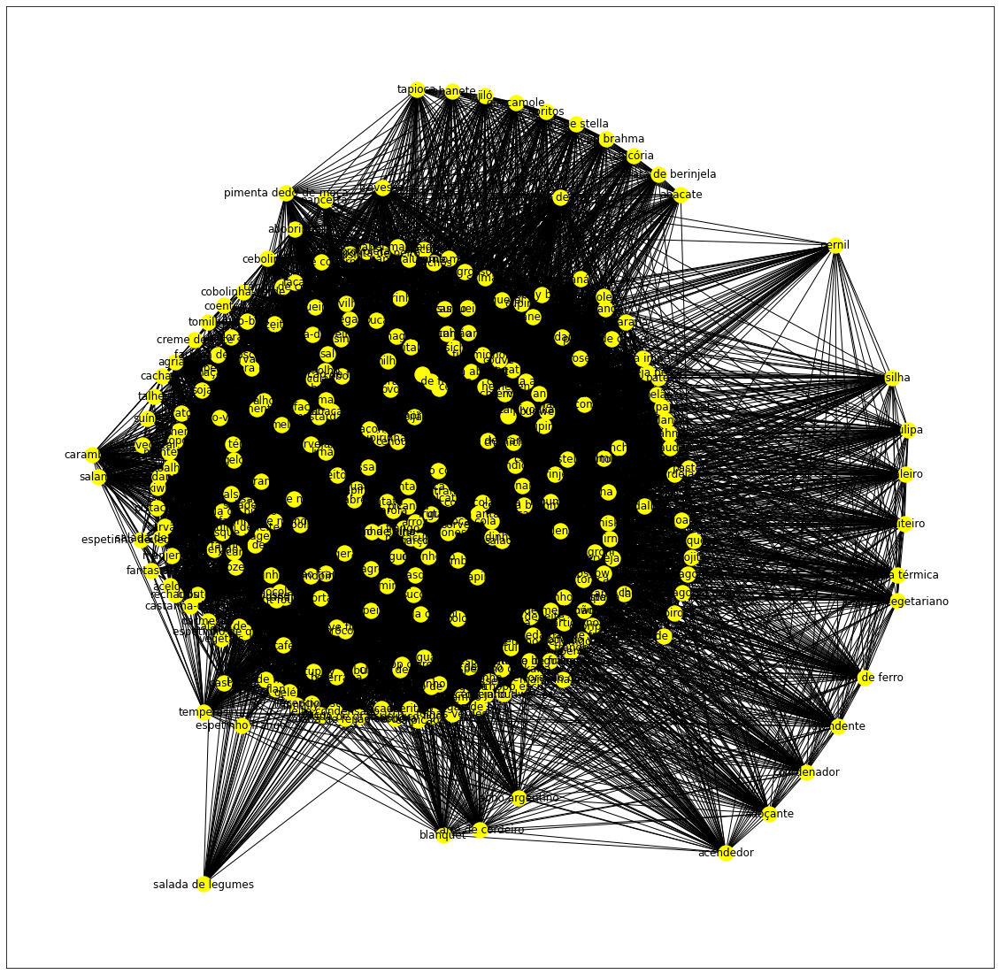

In [23]:
# Visualização da rede
plt.figure(figsize=(20,20))
nx.draw_networkx(g, node_color = 'yellow', node_size = 300, pos = nx.kamada_kawai_layout(g))

In [24]:
# Let’s define the BFS tree:
tree = nx.bfs_tree(g, tie)
print(list(tree.edges()))

[('cerveja brahma', 'abacaxi'), ('cerveja brahma', 'açucar'), ('cerveja brahma', 'água'), ('cerveja brahma', 'aipim'), ('cerveja brahma', 'ajudante'), ('cerveja brahma', 'alcatra'), ('cerveja brahma', 'alface'), ('cerveja brahma', 'ancho'), ('cerveja brahma', 'arroz'), ('cerveja brahma', 'azeitona'), ('cerveja brahma', 'baby beef'), ('cerveja brahma', 'bacon'), ('cerveja brahma', 'banana'), ('cerveja brahma', 'batata'), ('cerveja brahma', 'berinjela'), ('cerveja brahma', 'bolo'), ('cerveja brahma', 'budweiser'), ('cerveja brahma', 'caipirinha'), ('cerveja brahma', 'caipivodka'), ('cerveja brahma', 'calabresa'), ('cerveja brahma', 'canela'), ('cerveja brahma', 'cebola'), ('cerveja brahma', 'cenoura'), ('cerveja brahma', 'cerveja'), ('cerveja brahma', 'cerveja amstel'), ('cerveja brahma', 'cerveja antarctica'), ('cerveja brahma', 'cerveja budweiser'), ('cerveja brahma', 'cerveja skol'), ('cerveja brahma', 'cerveja stella artois'), ('cerveja brahma', 'pão francês'), ('cerveja brahma', 'ch

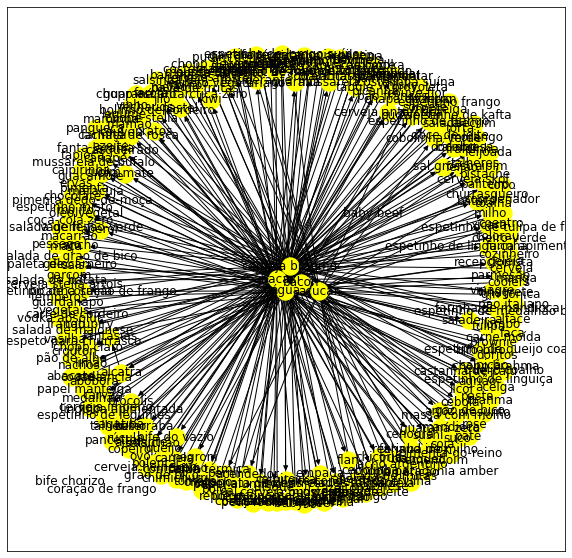

In [25]:
# Como podemos ver, a árvore de pesquisa no BFS é diferente do que era quando executamos o algoritmo de pesquisa DFS.
plt.figure(figsize=(10,10))
nx.draw_networkx(tree, node_color = 'yellow', node_size = 300)

{'whiskers': [<matplotlib.lines.Line2D at 0x2123b3b8610>,
 'caps': [<matplotlib.lines.Line2D at 0x2123b3b8c70>,
 'boxes': [<matplotlib.lines.Line2D at 0x2123b3b8340>],
 'medians': [<matplotlib.lines.Line2D at 0x2123b418190>],
 'fliers': [<matplotlib.lines.Line2D at 0x2123b418460>],
 'means': []}

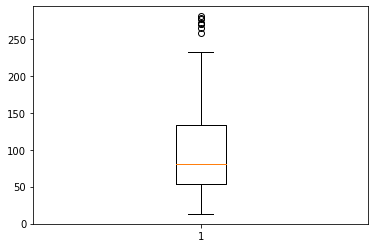

In [26]:
# Pega todos os degree dos nós e desenha um boxplot da rede
#plt.figure(figsize=(15,10))

my_degrees = g.degree()
degree_values = dict(my_degrees).values()

plt.boxplot(degree_values)

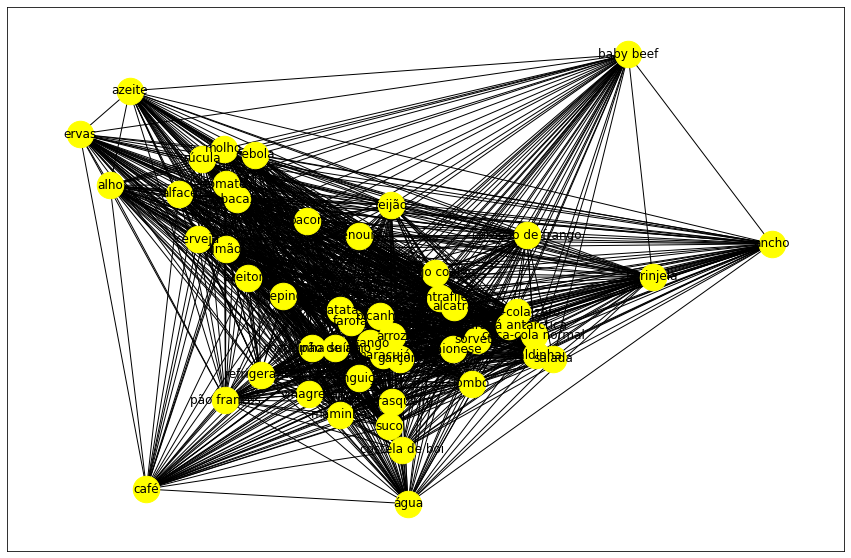

In [29]:
# Rede com nós com maior grau de centralidade
#import operator
#import networkx as nx
#import matplotlib.pyplot as plt
#%matplotlib inline

def centrality_sort(centrality_dict):
    return sorted(centrality_dict.items(),key=operator.itemgetter(1))

#centrality : which nodes have the highest /lowest degree centrality
degree_cent = nx.degree_centrality(g)
degree_sorted = centrality_sort(degree_cent)

#closenness centrality : which nodes have the highest and lowest closeness centrality
closeness_cent = nx.closeness_centrality(g)
closeness_sorted = centrality_sort(closeness_cent)

highest_degree = [node[0] for node in degree_sorted[-50:]]

#create a subgraph
sub = g.subgraph(highest_degree)
plt.figure(figsize=(15,10))
nx.draw_networkx(sub,node_size = 700, node_color = 'yellow', pos = nx.kamada_kawai_layout(g), with_labels=True)

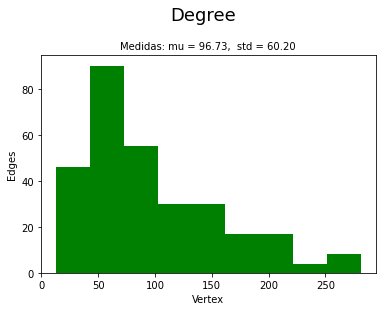

In [30]:
# Histograma
# Valores da rede
my_degrees = g.degree()
degree_values = dict(my_degrees).values()

# Medidas de centralidade e dispersão (média e desvio)
mu = np.mean(list(degree_values))  # mean of distribution
std = np.std(list(degree_values))  # standard deviation of distribution

# Regra de sturges para determinar nº de classes do histograma (bin)
sturges = int(np.trunc(1+3.3*np.log10(len(degree_values))))


x_label ='Vertex'
y_label ='Edges'
stitle = "Medidas: mu = %.2f,  std = %.2f" % (mu, std)
plt.suptitle('Degree', fontsize = 18, y = 1.05)
plt.title(stitle, fontsize = 10)
plt.xlabel(x_label)
plt.ylabel(y_label)
plt.hist(degree_values, bins = sturges, color='g')
plt.show()

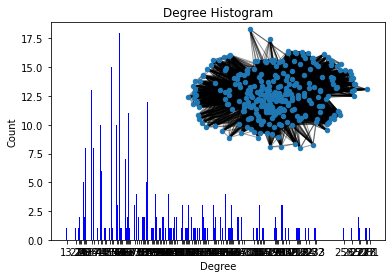

In [31]:
import collections
degree_sequence = sorted([d for n, d in g.degree()], reverse=True)  # degree sequence
degreeCount = collections.Counter(degree_sequence)
deg, cnt = zip(*degreeCount.items())

fig, ax = plt.subplots()
plt.bar(deg, cnt, width=0.80, color="b")

plt.title("Degree Histogram")
plt.ylabel("Count")
plt.xlabel("Degree")
ax.set_xticks([d + 0.4 for d in deg])
ax.set_xticklabels(deg)

# draw graph in inset
plt.axes([0.4, 0.4, 0.5, 0.5])
Gcc = g.subgraph(sorted(nx.connected_components(g), key=len, reverse=True)[0])
pos = nx.spring_layout(g)
plt.axis("off")
nx.draw_networkx_nodes(g, pos, node_size=20)
nx.draw_networkx_edges(g, pos, alpha=0.4)
plt.show()

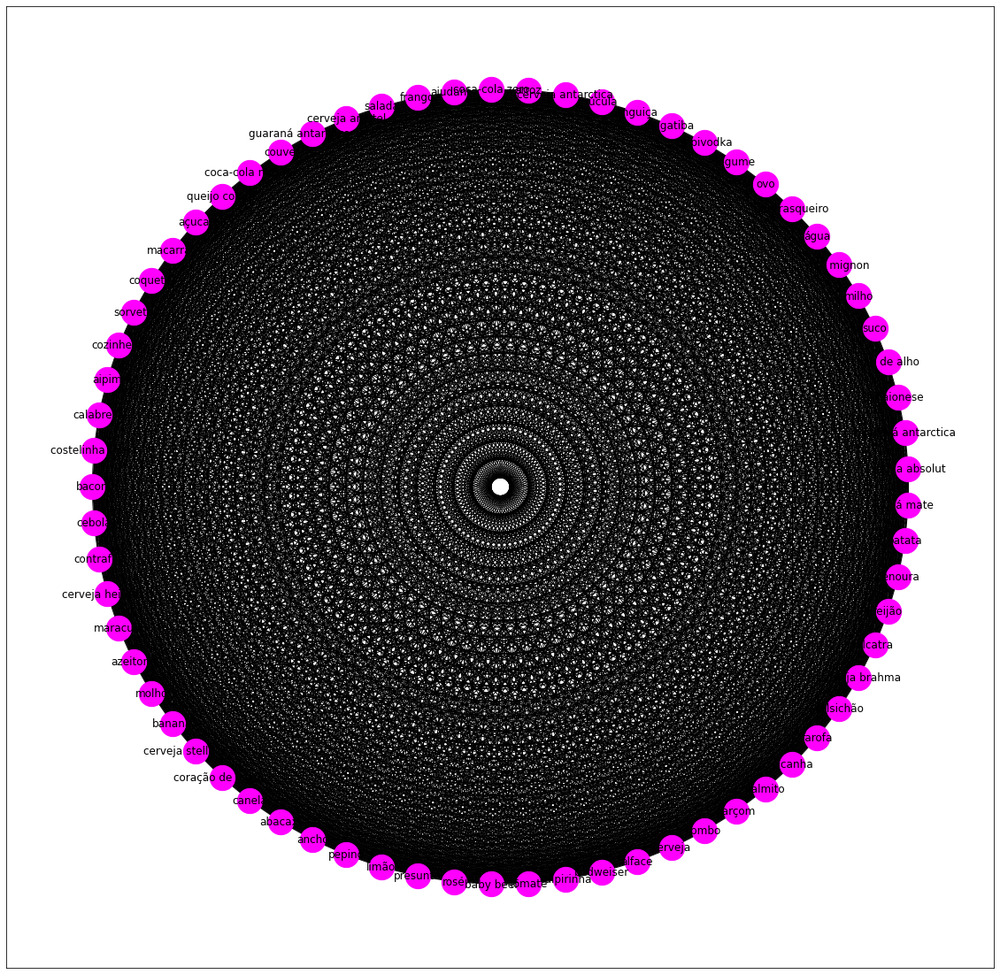

In [40]:
# Rede com base no ego selecionado
ego_net = nx.ego_graph(g, 'cerveja amstel')
pos=nx.shell_layout(ego_net)
plt.figure(figsize=(20,20))
nx.draw_networkx(ego_net, pos, node_size=800, node_color='magenta')

C:\Users\99836932\AppData\Local\Temp\ipykernel_19596\1883779225.py:6: DeprecationWarning: info is deprecated and will be removed in version 3.0.

  print(nx.info(ego_net))


Graph with 69 nodes and 2346 edges


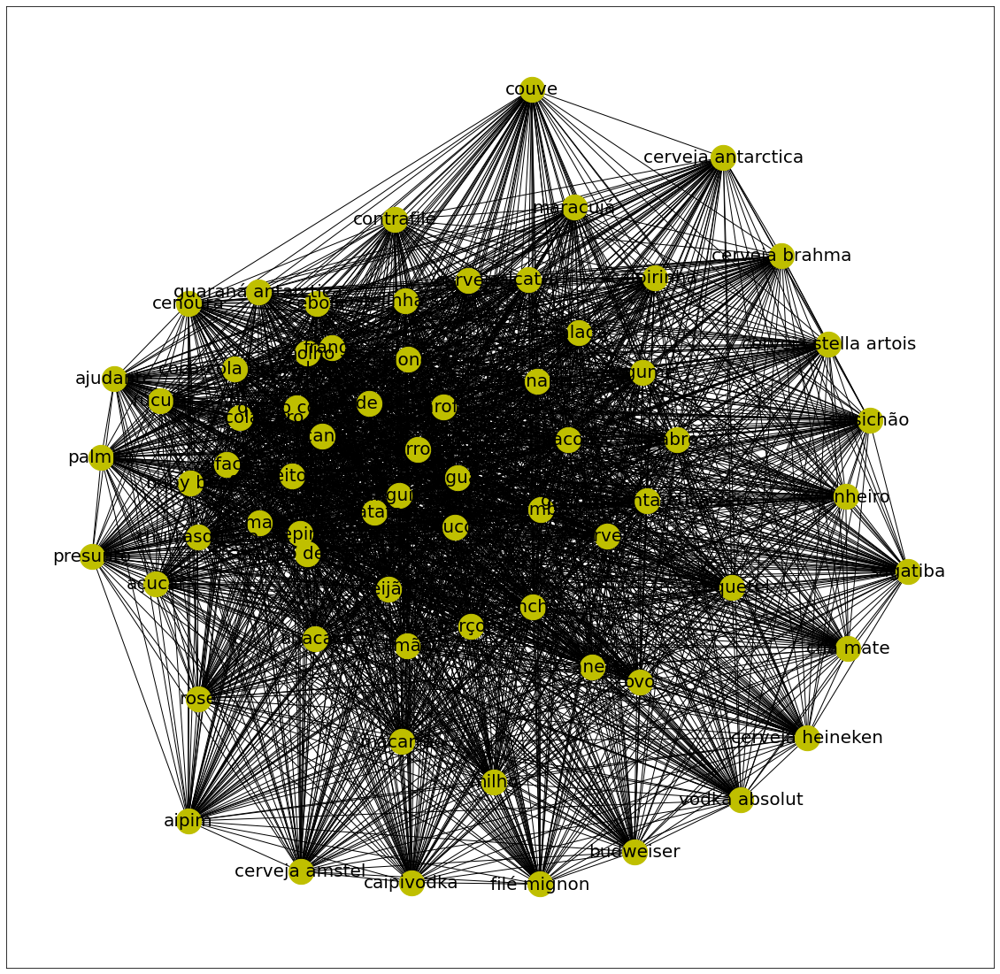

In [67]:
# Determina a rede com base no ego selecionado
nx.ego_graph(g,"cerveja petra", 1)
plt.figure(figsize=(20, 20))
pos = nx.spring_layout(ego_net)
nx.draw_networkx(ego_net, pos, with_labels=True, node_size=800, alpha=1, node_color='y',font_size=20)
print(nx.info(ego_net))

In [69]:
ego_net.edges

EdgeView([('bacon', 'abacaxi'), ('bacon', 'açucar'), ('bacon', 'água'), ('bacon', 'aipim'), ('bacon', 'ajudante'), ('bacon', 'alcatra'), ('bacon', 'alface'), ('bacon', 'ancho'), ('bacon', 'arroz'), ('bacon', 'azeitona'), ('bacon', 'baby beef'), ('bacon', 'banana'), ('bacon', 'batata'), ('bacon', 'budweiser'), ('bacon', 'caipirinha'), ('bacon', 'caipivodka'), ('bacon', 'calabresa'), ('bacon', 'canela'), ('bacon', 'cebola'), ('bacon', 'cenoura'), ('bacon', 'cerveja'), ('bacon', 'cerveja amstel'), ('bacon', 'cerveja antarctica'), ('bacon', 'cerveja brahma'), ('bacon', 'cerveja stella artois'), ('bacon', 'chá mate'), ('bacon', 'churrasqueiro'), ('bacon', 'coca-cola normal'), ('bacon', 'coca-cola zero'), ('bacon', 'contrafilé'), ('bacon', 'coquetel'), ('bacon', 'coração de frango'), ('bacon', 'costelinha suína'), ('bacon', 'couve'), ('bacon', 'frango'), ('bacon', 'cozinheiro'), ('bacon', 'farofa'), ('bacon', 'feijão'), ('bacon', 'filé mignon'), ('bacon', 'garçom'), ('bacon', 'guaraná antarc

In [43]:
# Função para identificação de indivíduos influentes na rede
def hierarchy_pos(g, root, width= 1., vert_gap = 0.2, vert_loc = 0, xcenter = 0.5 ):
    def h_recur(G, root, width=1., vert_gap = 0.2, vert_loc = 0, xcenter = 0.5,
                pos = None, parent = None, parsed = [] ):
        if(root not in parsed):
            parsed.append(root)
            if pos == None:
                pos = {root:(xcenter,vert_loc)}
            else:
                pos[root] = (xcenter, vert_loc)
                neighbors = G.neighbors(root)
                if parent != None:
                    neighbors.remove(parent)
                if len(neighbors)!=0:
                    dx = width/len(neighbors)
                    nextx = xcenter - width/2 - dx/2
                    for neighbor in neighbors:
                        nextx += dx
                        pos = h_recur(G,neighbor, width = dx, vert_gap = 
                                      vert_gap, vert_loc = vert_loc-vert_gap, xcenter=nextx, pos=pos,
                                      parent = root, parsed = parsed)
                return pos
            return h_recur(G, root, width=1., vert_gap = 0.2, vert_loc = 0, xcenter = 0.5)

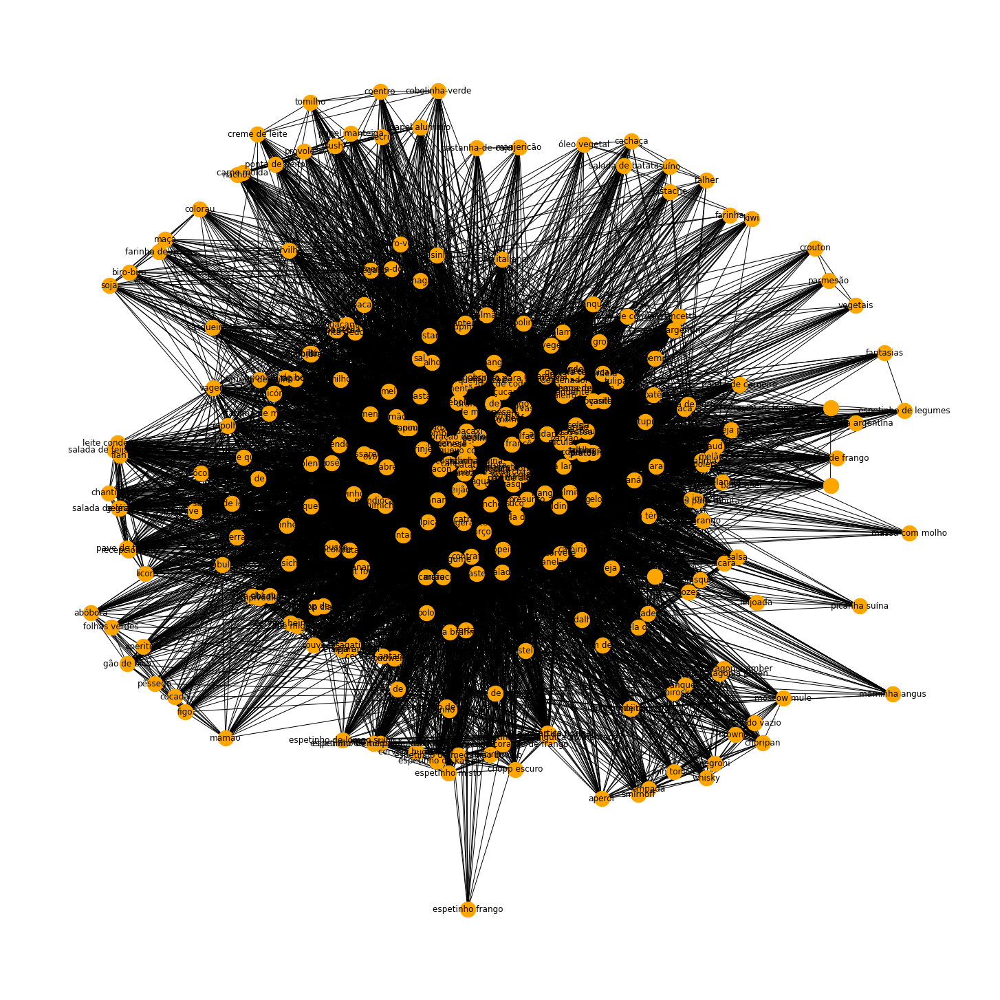

In [44]:
# Posição hierárquica na rede
pos = hierarchy_pos(g,1)
plt.figure(figsize=(20, 20))
nx.draw(g, pos=pos, with_labels=True, node_size= 500,
node_color='orange')

## Community detection

In [45]:
# Pacotes necessários
#!pip install python-louvain
#import matplotlib.cm as cm
#from community import community_louvain

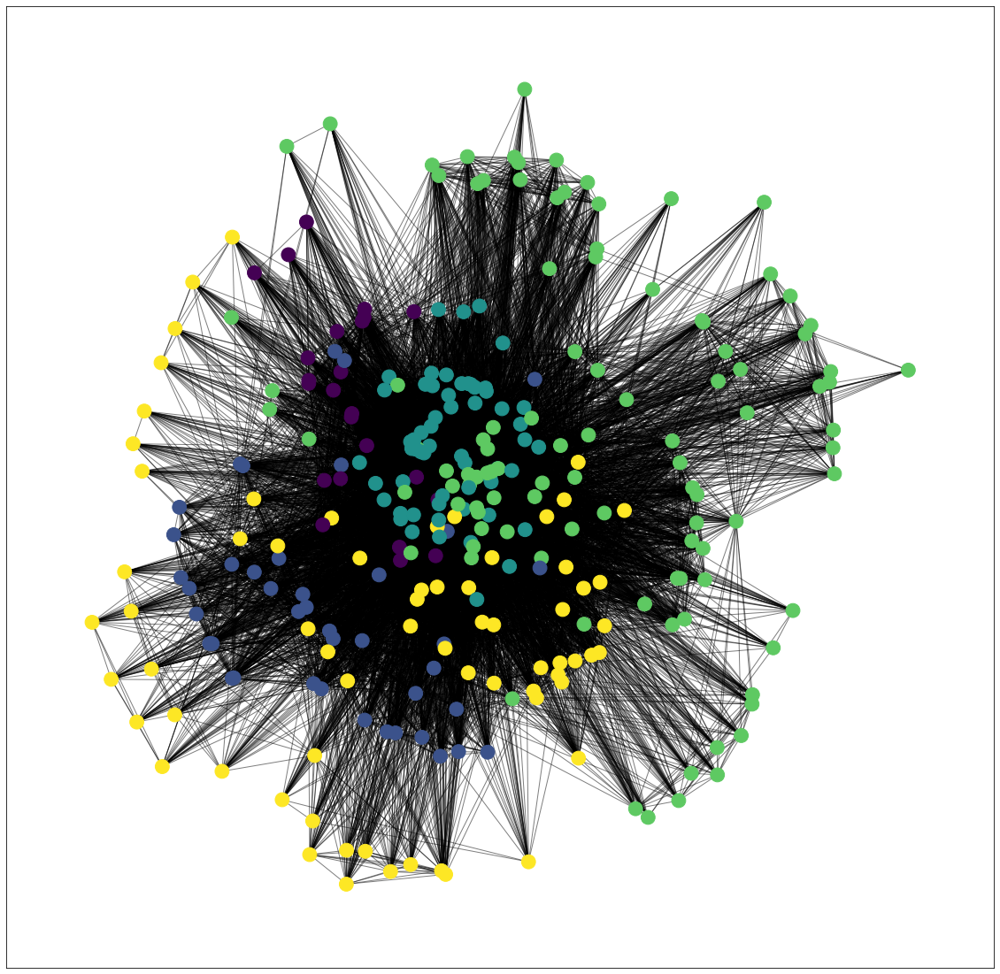

In [57]:
# Communities
partition = community_louvain.best_partition(g)
pos = nx.spring_layout(g)
#pos = nx.kamada_kawai_layout(g)
cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
plt.figure(figsize=(20, 20))
nx.draw_networkx_nodes(g, pos, partition.keys(), node_size=250, cmap=cmap, node_color=list(partition.values()))
nx.draw_networkx_edges(g, pos, alpha=0.5)
plt.show()

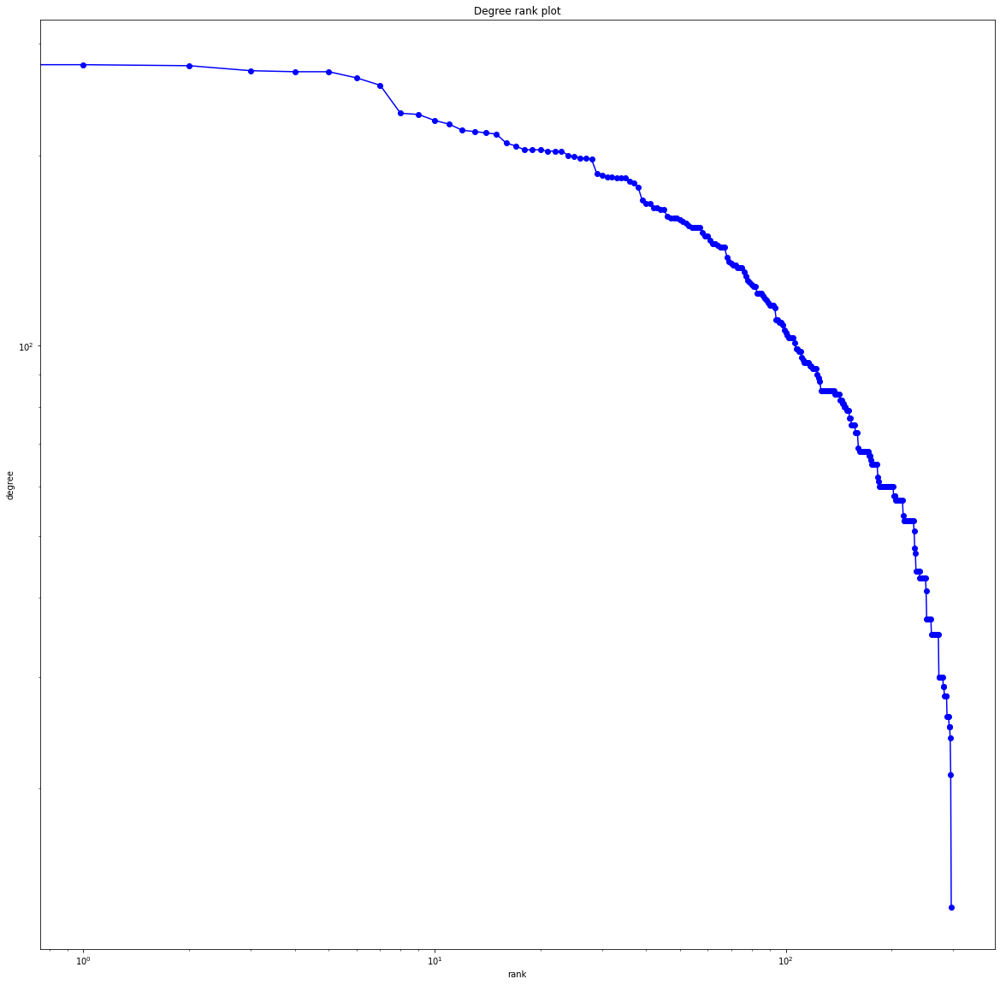

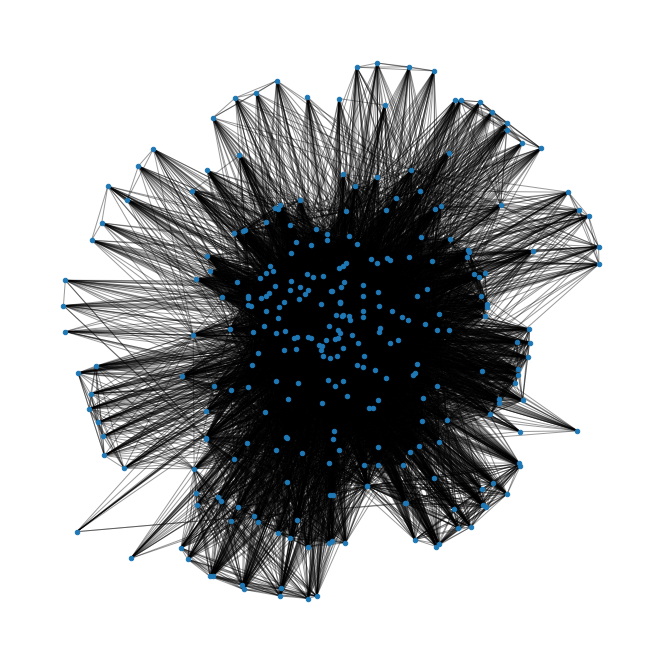

In [47]:
# Degree rank graph
degree_sequence = sorted([d for n, d in g.degree()], reverse=True)
dmax = max(degree_sequence)
plt.figure(figsize=(20, 20))
plt.loglog(degree_sequence, "b-", marker="o")
plt.title("Degree rank plot")
plt.ylabel("degree")
plt.xlabel("rank")

# draw graph in inset
plt.figure(figsize=(20, 20))
plt.axes([0.45, 0.45, 0.45, 0.45])
Gcc = g.subgraph(sorted(nx.connected_components(g), key=len, reverse=True)[0])
pos = nx.spring_layout(Gcc)
plt.axis("off")
nx.draw_networkx_nodes(Gcc, pos, node_size=20)
nx.draw_networkx_edges(Gcc, pos, alpha=0.4)
plt.show()

In [48]:
# Dendograma
from community import generate_dendrogram
from community import partition_at_level

dendo = generate_dendrogram(g)
for level in range(len(dendo) - 1) :
    print("partition at level", level, "is", partition_at_level(dendo, level))

partition at level 0 is {'abacaxi': 3, 'abacate': 3, 'abobrinha': 2, 'água': 3, 'alface': 2, 'alho': 3, 'ancho': 3, 'arroz': 1, 'azeite': 3, 'azeitona': 3, 'baby beef': 2, 'bacon': 3, 'banana': 3, 'batata': 3, 'berinjela': 1, 'caponata de berinjela': 3, 'casqueirado': 3, 'cebola': 3, 'cenoura': 3, 'cerveja': 3, 'pão francês': 0, 'chicória': 3, 'chimichurri': 3, 'chopp brahma': 3, 'chope stella': 3, 'coca-cola normal': 2, 'coca-cola zero': 2, 'coração de frango': 2, 'costelinha suína': 0, 'cupim': 2, 'doritos': 3, 'drumet de frango': 3, 'ervas': 2, 'farofa': 5, 'guacamole': 3, 'guaraná antarctica': 2, 'guaraná antarctica zero': 3, 'jiló': 3, 'legume': 3, 'limão': 3, 'linguiça': 5, 'maionese': 3, 'mandioca': 3, 'manga': 2, 'mel': 3, 'ovo de codorna': 0, 'pão de alho': 5, 'pastel': 3, 'pepino': 2, 'picanha': 2, 'pimenta': 3, 'pimenta dedo-de-moça': 3, 'polenta': 3, 'queijo coalho': 3, 'rabanete': 3, 'rosé': 3, 'sal': 3, 'salmão': 3, 'tapioca': 3, 'tomate': 2, 'vinagrete': 5, 'acelga': 2, 

In [49]:
dendo_dict = partition_at_level(dendo, level)
df_dendo = pd.DataFrame(list(dendo_dict.items()), columns = ['dendo', 'level'])
df_dendo.head()

,dendo,level
0,abacaxi,3
1,abacate,3
2,abobrinha,2
3,água,3
4,alface,2


## Communities 2

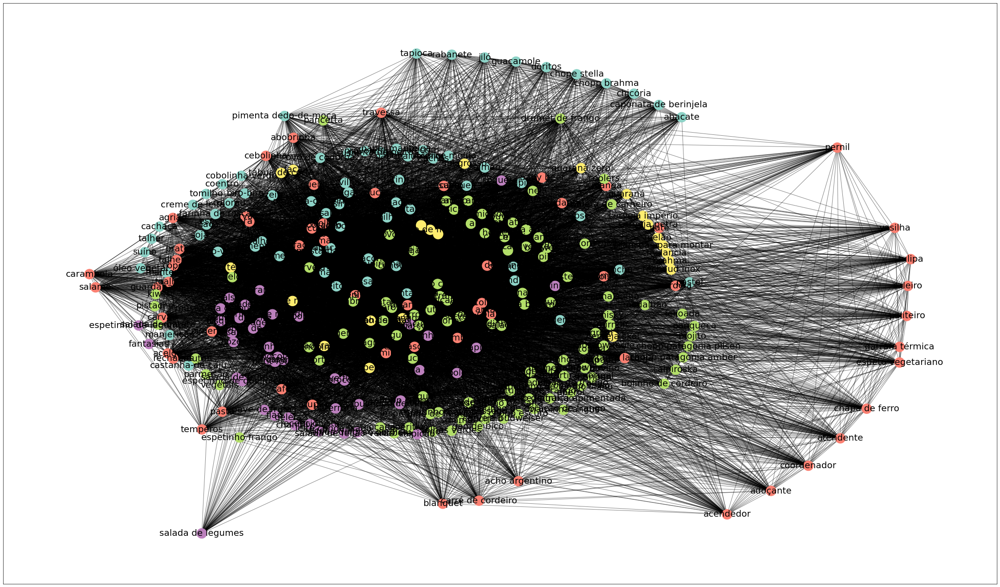

In [63]:
# Louvin 
# https://python-louvain.readthedocs.io/en/latest/
#import community as community_louvain
#import matplotlib.cm as cm
#import matplotlib.pyplot as plt
#import networkx as nx

g = nx.from_pandas_edgelist(ds, 'source', 'target', ['weight'])

labels = g.nodes()
plt.figure(figsize=(40,24))
# compute the best partition
partition = community_louvain.best_partition(g)

# draw the graph
pos = nx.kamada_kawai_layout(g)
# color the nodes according to their partition
cmap = cm.get_cmap('Set3', max(partition.values()) + 1)
#nx.draw_networkx_labels(g,pos=pos,edge_labels=labels,font_size=12) #with_labels=True
nx.draw_networkx_labels(g, pos=pos,font_size=20)
nx.draw_networkx_nodes(g, pos, partition.keys(), node_size=500, cmap=cmap, node_color=list(partition.values()))
nx.draw_networkx_edges(g, pos, alpha=0.5)
plt.savefig("Cestas_Churrasco_LouvinGraph.png", format="PNG", dpi=300)

In [65]:
# Partições
partition_df = pd.DataFrame(partition.items(), columns = ['User','Partition'])
partition_df = partition_df.sort_values(by=["Partition"], ascending=False)
partition_df.to_csv('Cestas_Churrasco_Partitions.csv')
partition_df

,User,Partition
162,sal grosso,4
123,cerveja império,4
165,salada de maionese,4
175,tábua de corte,4
156,rechaud inox,4
...,...,...
109,farinha,0
106,ervilha,0
94,colorau,0
91,cheiro-verde,0
